# Coffee Bean Roast Classifier




<!DOCTYPE html>
<html lang=”en”>
   <body>
      <!--Centered Image Start-->
      <div style="text-align: center;">
         <img width="500" src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/60/SDAIA-Logo-2.png/1200px-SDAIA-Logo-2.png" alt="Tuwaiq Academy">
      </div>

   </body>
</html>

<div style="text-align: center;">
     
<h2>Group Members</h2>
<h3>Salwa Bukhari (salwa.bukhari9@gmail.com) </h3>
<h3>Sara Alsadoun (SaraAlsadoun@hotmail.com)</h3>
<h3>Mussab Al-bargi (Albargi-454@hotmail.com) </h3>
<h3>Abdulrahman Ghazwani (d.m1999y@gmail.com)</h3>
<h3>Azzam Garwan (azzamgarwan0@gmail.com) </h3>

  </div>    
</body>
</html>

### Problem Statement
#### Achieving consistent and desired coffee roast levels is crucial for producing high-quality coffee. Traditional methods for determining coffee bean roast rely on visual inspection and subjective sensory evaluation, which are subjective, time-consuming, and prone to human error. These limitations lead to inconsistencies in roasting practices and can result in uneven roast profiles, negatively impacting the flavor and aroma of coffee.

### To address these challenges, we propose developing a coffee bean roast classification model using the Inception architecture, a deep learning architecture known for its efficient and accurate image classification capabilities. The model will be trained on a large and diverse dataset of coffee bean images representing different roast levels, enabling it to accurately classify coffee beans based on their color, texture, and surface characteristics.

### Mounting to Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
zip_file_path = '/content/drive/MyDrive/archive (6).zip'

extracted_path = '/content/extracted/'

!mkdir -p "$extracted_path"

!unzip "$zip_file_path" -d "$extracted_path"


Archive:  /content/drive/MyDrive/archive (6).zip
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (1).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (10).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (100).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (11).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (12).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (13).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (14).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (15).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_dataset/test/Dark/dark (16).png  
  inflating: /content/extracted/data_image_png_3024x3024/coffee_datas

### Import the required libraries

In [ ]:
import os
import shutil
from shutil import copyfile
import zipfile
import random

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import PIL
from tensorflow.keras.callbacks import EarlyStopping


### Set All Constants

In [ ]:
batch_size = 32
img_height = 224
img_width = 224
validation_splits=0.4
learning_rates=0.0001
seeds=123
num_classes=4


### Data Split

In [ ]:
train_dataset_path = "/content/extracted/data_image_png_3024x3024/coffee_dataset/train"
# Create the validation dataset with validation split
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dataset_path,
    validation_split=validation_splits,
    subset="training",
    seed=seeds,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode="categorical"
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    train_dataset_path,
    validation_split=validation_splits,  # 20%
    subset="validation",
    seed=seeds,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode="categorical"
)

# early stop
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=3,  # 3 more epochs after early stop
    restore_best_weights=True
)
print()


train_size = train_ds.cardinality().numpy()

val_size = val_ds.cardinality().numpy()
print()

print("Number of samples in the entire dataset:", train_size + val_size)
print("Number of samples in training dataset:", train_size)
print("Number of samples in validation dataset:", val_size)


print()
class_names = train_ds.class_names
print(class_names)

class_names = val_ds.class_names
print(class_names)


Found 1200 files belonging to 4 classes.
Using 720 files for training.
Found 1200 files belonging to 4 classes.
Using 480 files for validation.


Number of samples in the entire dataset: 38
Number of samples in training dataset: 23
Number of samples in validation dataset: 15

['Dark', 'Green', 'Light', 'Medium']
['Dark', 'Green', 'Light', 'Medium']


### classes weight

In [ ]:
#check the classes weight to avoid Bias
from pathlib import Path
dataset_path = Path("/content/extracted/data_image_png_3024x3024/coffee_dataset/train")

class_names = ['Dark', 'Green', 'Light', 'Medium']

num_images = {}
for class_name in class_names:
    num_images[class_name] = len(tuple((dataset_path / class_name).glob('*')))

total = sum(num_images.values())
class_weights = {
    label: (1 / num_images) * (total / 2.0)
    for label, num_images in enumerate(num_images.values())
}

print(num_images)

class_weights

{'Dark': 300, 'Green': 300, 'Light': 300, 'Medium': 300}


{0: 2.0, 1: 2.0, 2: 2.0, 3: 2.0}

### Data Augmentation

In [ ]:

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.RandomZoom(0.1),
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomFlip("vertical"),
])

### Visualizing the first training batch

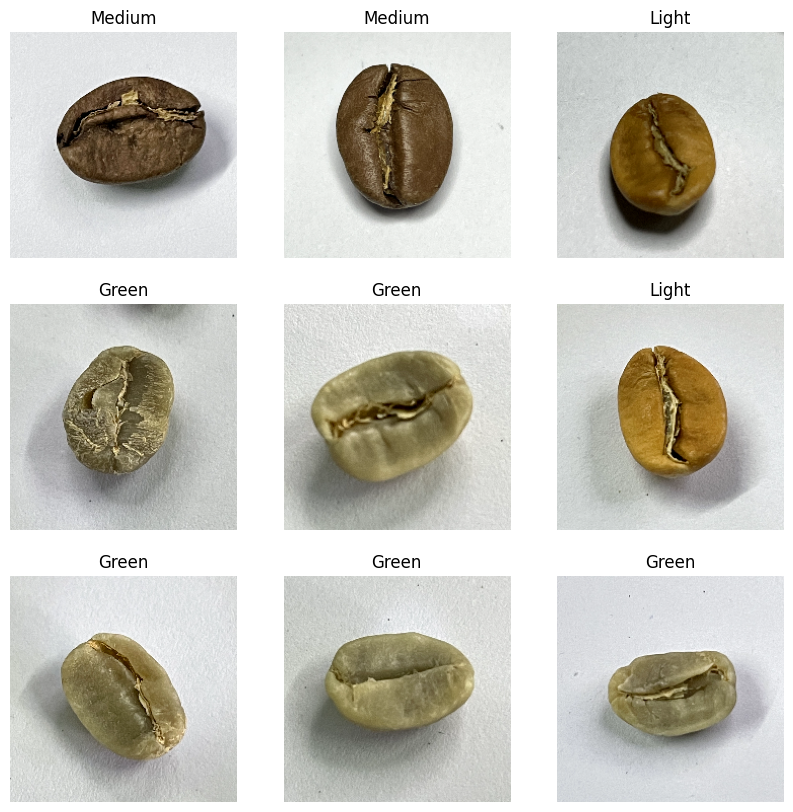

In [ ]:
plt.figure(figsize=(10,10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    #plt.title(class_names[labels[i]])
    plt.title(class_names[list(labels[i]).index(1)])
    plt.axis("off")

### Classes avaliable in dataset

### Chcking on data split to train and validate

### Data Preprocessing

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(2000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### Transfer learning

In [ ]:

incep_model = tf.keras.applications.inception_v3.InceptionV3(
    include_top=False,
    weights="imagenet",
    input_shape=(img_height, img_width, 3),
)
# Freeze the incep_model (base_model)
incep_model.trainable = False

In [ ]:
def transfer_learning_model():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(img_height, img_width, 3), name="input_layer"),
    # Rescale pixel values to the range [0, 1]
    tf.keras.layers.Rescaling(1./255),
    # Apply data augmentation (assuming data_augmentation is a predefined layer)
    data_augmentation,
    # Pre-trained InceptionV3 model
    incep_model,
    tf.keras.layers.Conv2D(64, (3, 3), activation="relu"),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(128, activation="relu"),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(512, activation="relu"),
    tf.keras.layers.Dense(num_classes, activation="softmax")
  ])

  return model

In [ ]:
transfer_model = transfer_learning_model()

transfer_model.build(input_shape=(None, img_height, img_width, 3))
transfer_model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_6 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 conv2d_377 (Conv2D)         (None, 3, 3, 64)          1179712   
                                                                 
 global_average_pooling2d_8  (None, 64)                0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_19 (Dense)            (None, 128)               8320      
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                     

### Model Compiling

In [ ]:
transfer_model.compile(loss="categorical_crossentropy",
                   optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rates),
                   metrics=["accuracy"],
                   )

### Model Fitting

In [ ]:
transfer_history = transfer_model.fit(train_ds,
               epochs=30,
               verbose=1,
               validation_data=val_ds,
              # class_weight=class_weights, no need all classes are equals
               callbacks=[early_stopping]
                            )


Epoch 1/30
23/23 [==============================] - 2s 70ms/step - loss: 0.0751 - accuracy: 0.9847 - val_loss: 0.1465 - val_accuracy: 0.9500
Epoch 2/30
23/23 [==============================] - 1s 63ms/step - loss: 0.0787 - accuracy: 0.9847 - val_loss: 0.1423 - val_accuracy: 0.9500
Epoch 3/30
23/23 [==============================] - 1s 57ms/step - loss: 0.0726 - accuracy: 0.9847 - val_loss: 0.1476 - val_accuracy: 0.9479
Epoch 4/30
23/23 [==============================] - 1s 57ms/step - loss: 0.0596 - accuracy: 0.9903 - val_loss: 0.1523 - val_accuracy: 0.9396
Epoch 5/30
23/23 [==============================] - 1s 64ms/step - loss: 0.0638 - accuracy: 0.9903 - val_loss: 0.1404 - val_accuracy: 0.9583
Epoch 6/30
23/23 [==============================] - 1s 63ms/step - loss: 0.0614 - accuracy: 0.9889 - val_loss: 0.1391 - val_accuracy: 0.9542
Epoch 7/30
23/23 [==============================] - 1s 63ms/step - loss: 0.0572 - accuracy: 0.9889 - val_loss: 0.1361 - val_accuracy: 0.9521
Epoch 8/30
23

### Plotting the Accuracy and Loss

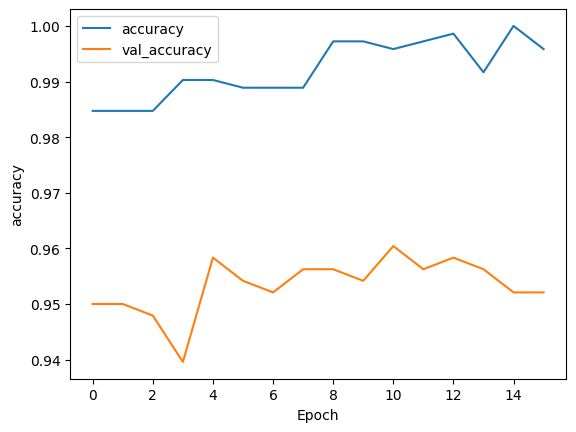

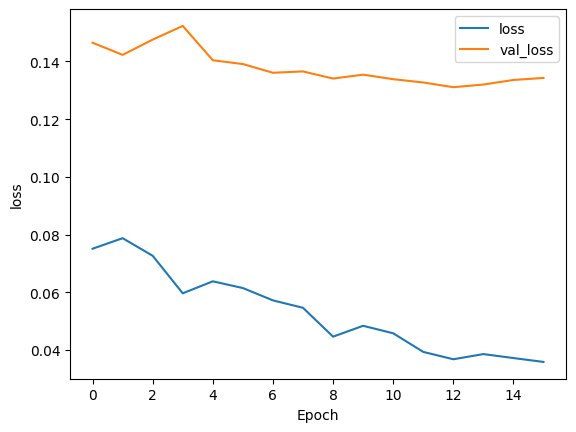

In [ ]:
def plot_result(plot_string, history):

  plt.plot(history.history[plot_string])
  plt.plot(history.history["val_" + plot_string])

  plt.xlabel("Epoch")
  plt.ylabel(plot_string)

  plt.legend([plot_string, "val_" + plot_string])

  plt.show()


plot_result("accuracy", history=transfer_history)
plot_result("loss", history=transfer_history)

### Model Save

### Visual Testing for prediction

1/1 [==============================] - 0s 27ms/step


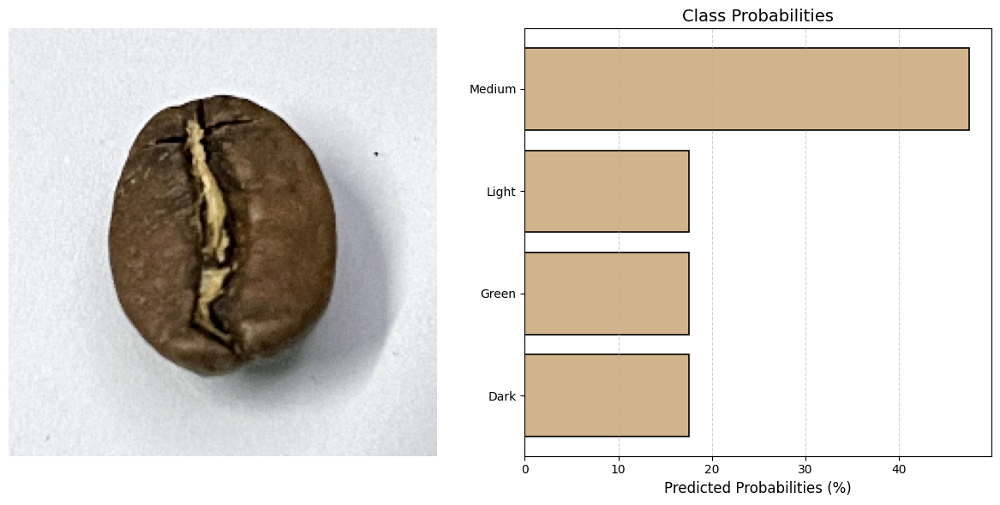

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import numpy as np

filepath = "/content/drive/MyDrive/last update/medium (93).png"

img = image.load_img(filepath, target_size=(img_height, img_width))

x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
# Make predictions using the pre-trained model
predict = transfer_model.predict(x)

score = tf.nn.softmax(predict)

percentage_score = score * 100

class_names_flat = np.array(class_names).flatten()

light_green = '#d2b48c'

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.barh(class_names_flat, percentage_score[0], color=light_green, edgecolor='black', linewidth=1.2)
plt.xlabel('Predicted Probabilities (%)', fontsize=12)
plt.title('Class Probabilities', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='x', linestyle='--', alpha=0.6)

plt.tight_layout()

plt.show()

### Classification Report

In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix


true_labels = []
predicted_indices = []

for images, labels in val_ds:
    true_labels.extend(labels.numpy().argmax(axis=1))
    predictions = transfer_model.predict(images)
    predicted_indices.extend(np.argmax(predictions, axis=1))
# Predict using the transfer_model and extend predicted_indices with the indices of the maximum predicted values
true_labels = np.array(true_labels)
predicted_indices = np.array(predicted_indices)

report = classification_report(true_labels, predicted_indices)

print(report)


1/1 [==============================] - 0s 42ms/step
              precision    recall  f1-score   support

           0       0.97      0.94      0.96       115
           1       0.97      0.98      0.98       126
           2       0.96      0.96      0.96       115
           3       0.93      0.95      0.94       124

    accuracy                           0.96       480
   macro avg       0.96      0.96      0.96       480
weighted avg       0.96      0.96      0.96       480



### Plotting Classification Report

1/1 [==============================] - 0s 41ms/step


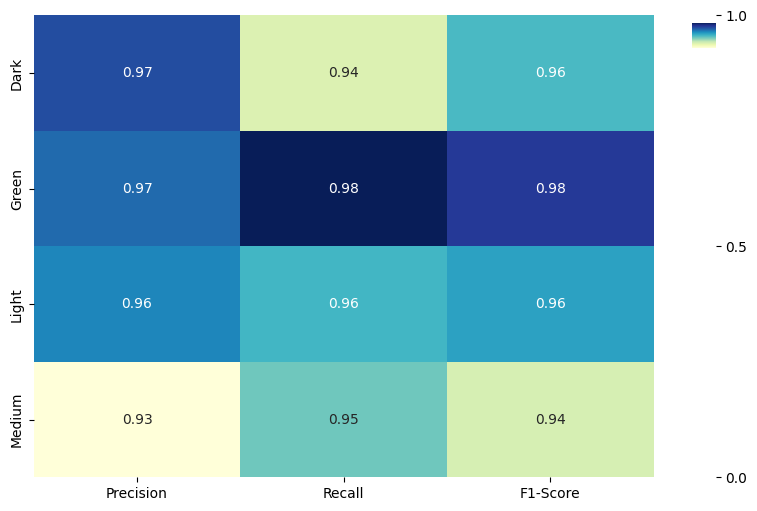

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

class_names = ['Dark', 'Green', 'Light', 'Medium']

true_labels = []
predicted_indices = []

for images, labels in val_ds:
    true_labels.extend(labels.numpy().argmax(axis=1))
    predictions = transfer_model.predict(images)
    predicted_indices.extend(np.argmax(predictions, axis=1))

# Convert true_labels and predicted_indices to NumPy arrays
true_labels = np.array(true_labels)
predicted_indices = np.array(predicted_indices)

# Generate a classification report using true_labels, predicted_indices, and target class names
report = classification_report(true_labels, predicted_indices, target_names=class_names, output_dict=True)

# Create a 2D array for heatmap data with precision, recall, and F1-score for each class
report_data = np.array([[float(v['precision']), float(v['recall']), float(v['f1-score'])] for k, v in report.items() if k in class_names])

# Create a heatmap using Seaborn
fig, ax = plt.subplots(figsize=(10, 6))
cax = sns.heatmap(report_data, annot=True, cmap="YlGnBu", xticklabels=['Precision', 'Recall', 'F1-Score'], yticklabels=class_names, ax=ax)

# Customize the colorbar
cbar = cax.collections[0].colorbar
cbar.set_ticks([0.0, 0.5, 1.0])
cbar.set_ticklabels(['0.0', '0.5', '1.0'])

# Show the plot
plt.show()
Explanation:


### Plotting Confusion Matrix

1/1 [==============================] - 0s 32ms/step


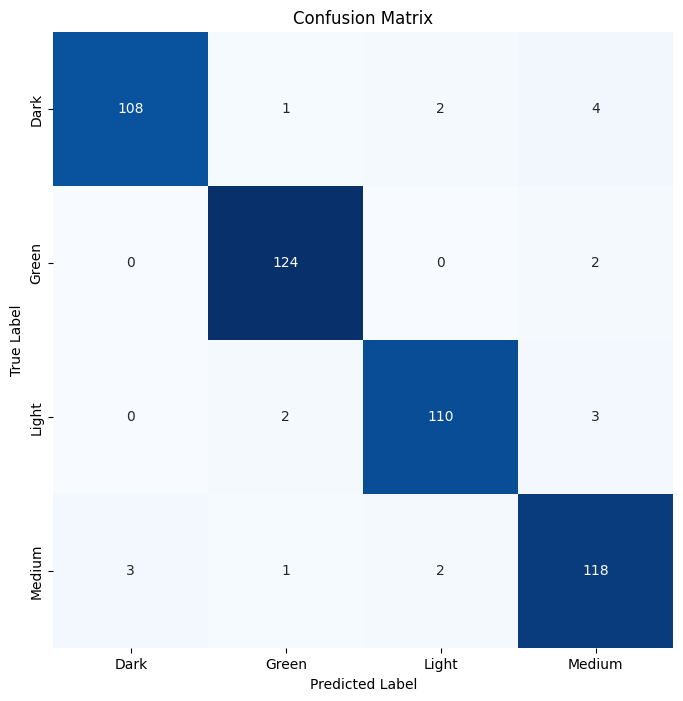

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np
from tensorflow.keras.models import load_model

model_path = "/content/drive/MyDrive/Colab Notebooks/Rust_TRanfer_learning_model.h5"
transfer_model = load_model(model_path)

def plot_confusion_matrix_heatmap(model, val_ds, threshold=0.5, class_names=['Dark', 'Green', 'Light', 'Medium']):
    plt.figure(figsize=(8, 8))

    y_true = []
    y_pred_probs = []

    for images, labels in val_ds:
        y_true.extend(np.argmax(labels.numpy(), axis=1))  # Convert one-hot encoded labels to class indices
        y_pred_probs.extend(np.argmax(model.predict(images), axis=1))

    y_true = np.array(y_true)
    y_pred_probs = np.array(y_pred_probs)

    cm = confusion_matrix(y_true, y_pred_probs)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=class_names,
                yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')

    plt.show()

# Assuming 4 classes with corresponding names
class_names = ['Dark', 'Green', 'Light', 'Medium']
plot_confusion_matrix_heatmap(model=transfer_model, val_ds=val_ds, threshold=0.5, class_names=class_names)


### Plotting ROC Curve

1/1 [==============================] - 0s 41ms/step


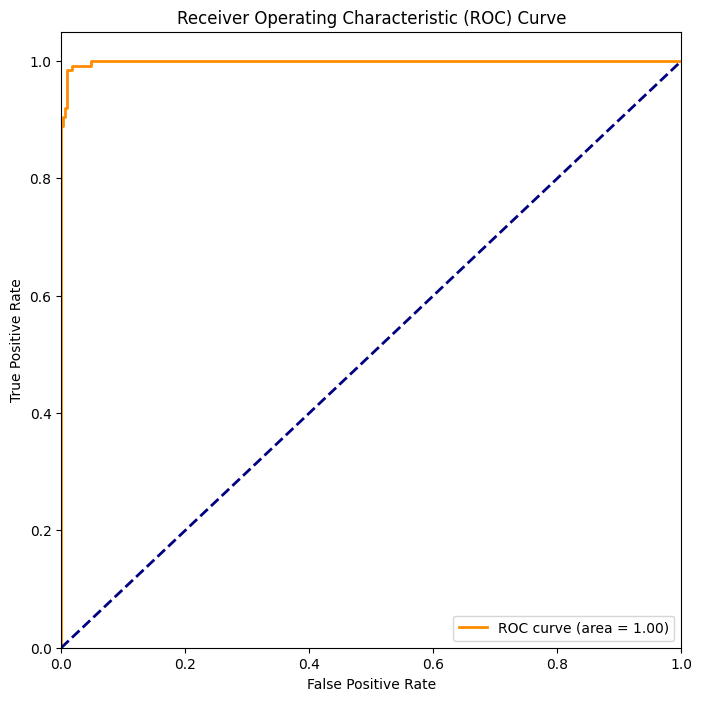

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import numpy as np

def plot_roc_curve(model, val_ds):
    # Create a figure with a specified size
    plt.figure(figsize=(8, 8))

    # Lists to store true labels and predicted probabilities
    y_true = []
    y_pred_probs = []

    # Iterate through the validation dataset (val_ds)
    for images, labels in val_ds:
        # Extend true_labels with the ground truth labels
        y_true.extend(labels.numpy())

        # Extend y_pred_probs with the predicted probabilities using the model
        y_pred_probs.extend(model.predict(images).squeeze())

    # Convert true labels and predicted probabilities to NumPy arrays
    y_true = np.array(y_true)
    y_pred_probs = np.array(y_pred_probs)

    # Calculate the ROC curve and area under the curve (AUC)
    fpr, tpr, thresholds = roc_curve(y_true[:, 1], y_pred_probs[:, 1])
    roc_auc = auc(fpr, tpr)

    # Plot the ROC curve
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))

    # Plot the diagonal line for reference
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

    # Set plot limits and labels
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')

    # Set the title and add a legend
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")

    # Display the plot
    plt.show()

# Example usage
plot_roc_curve(model=transfer_model, val_ds=val_ds)


### Showcase Confidence and predictions

Found 400 files belonging to 4 classes.
1/1 [==============================] - 0s 25ms/step


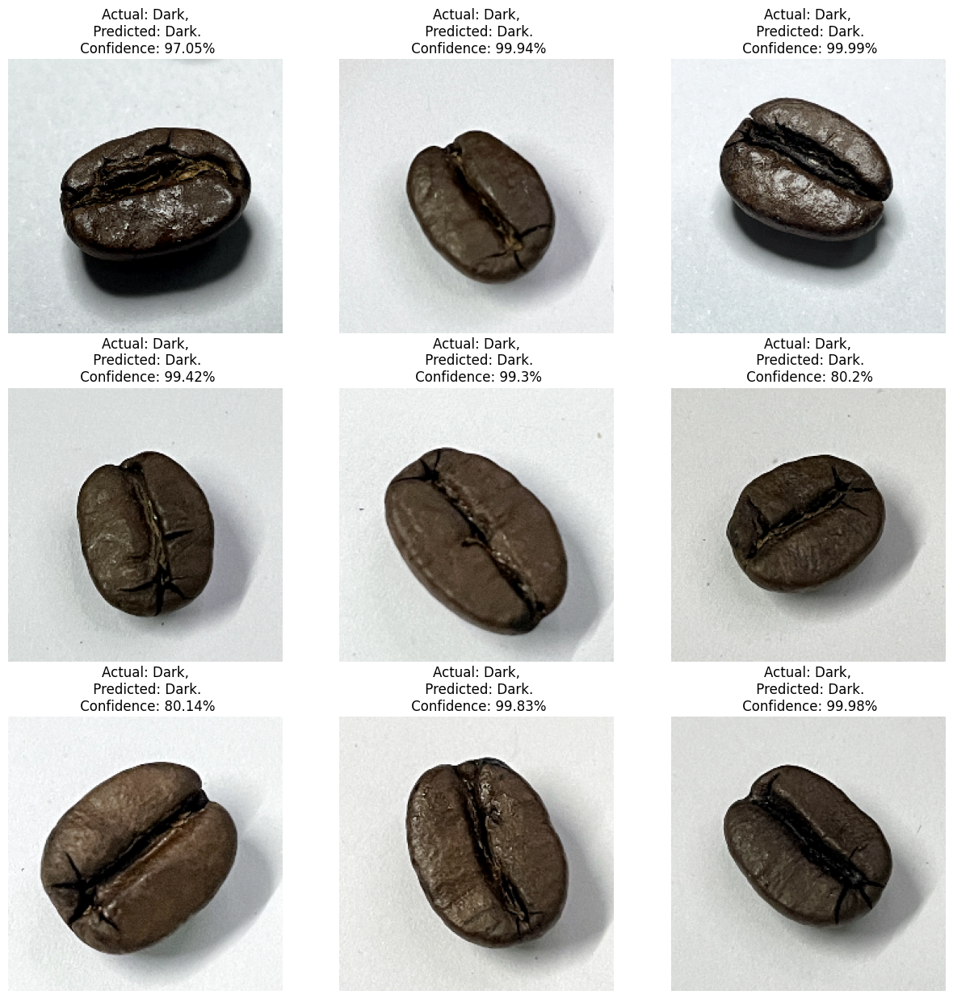

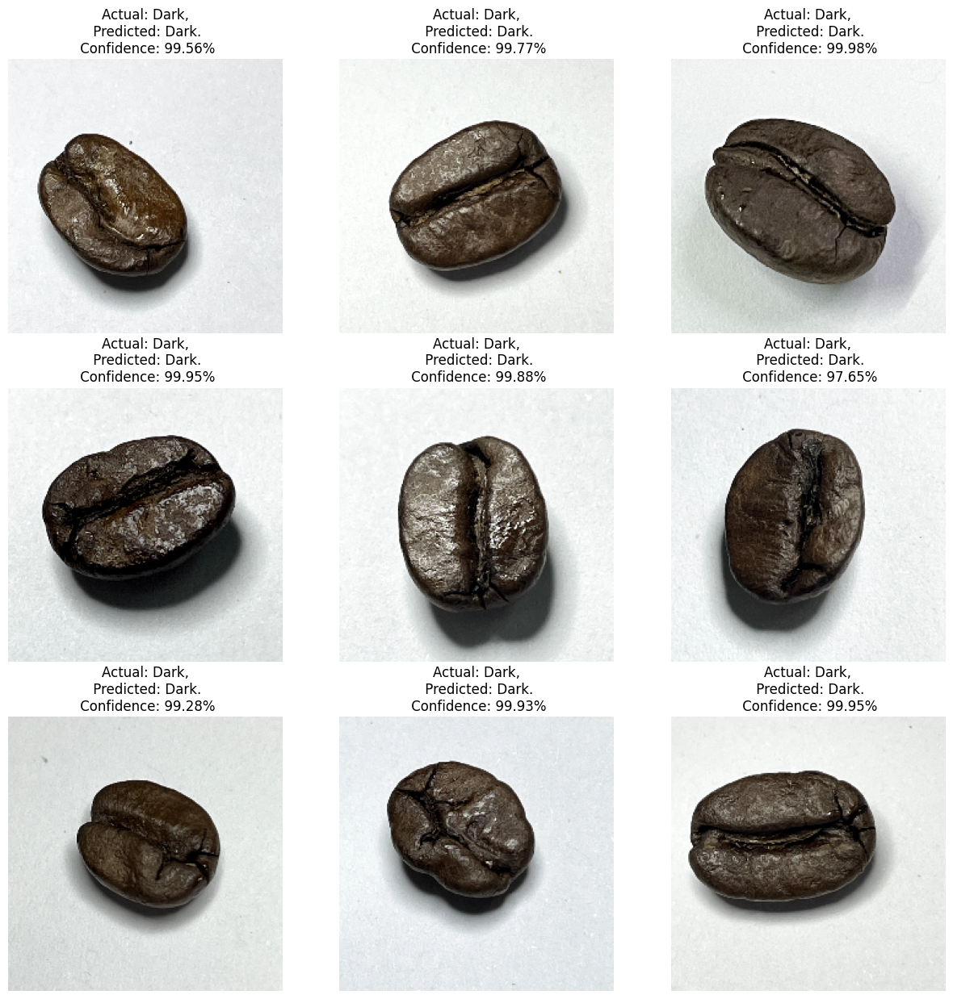

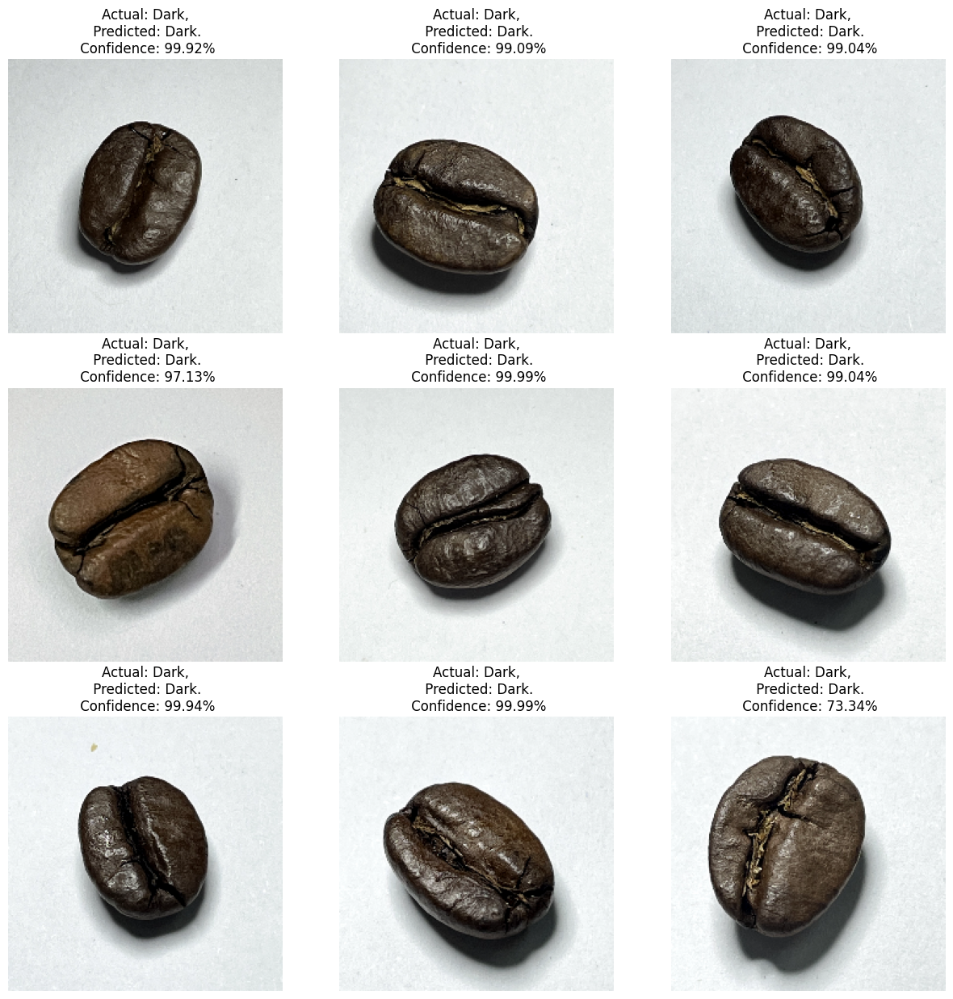

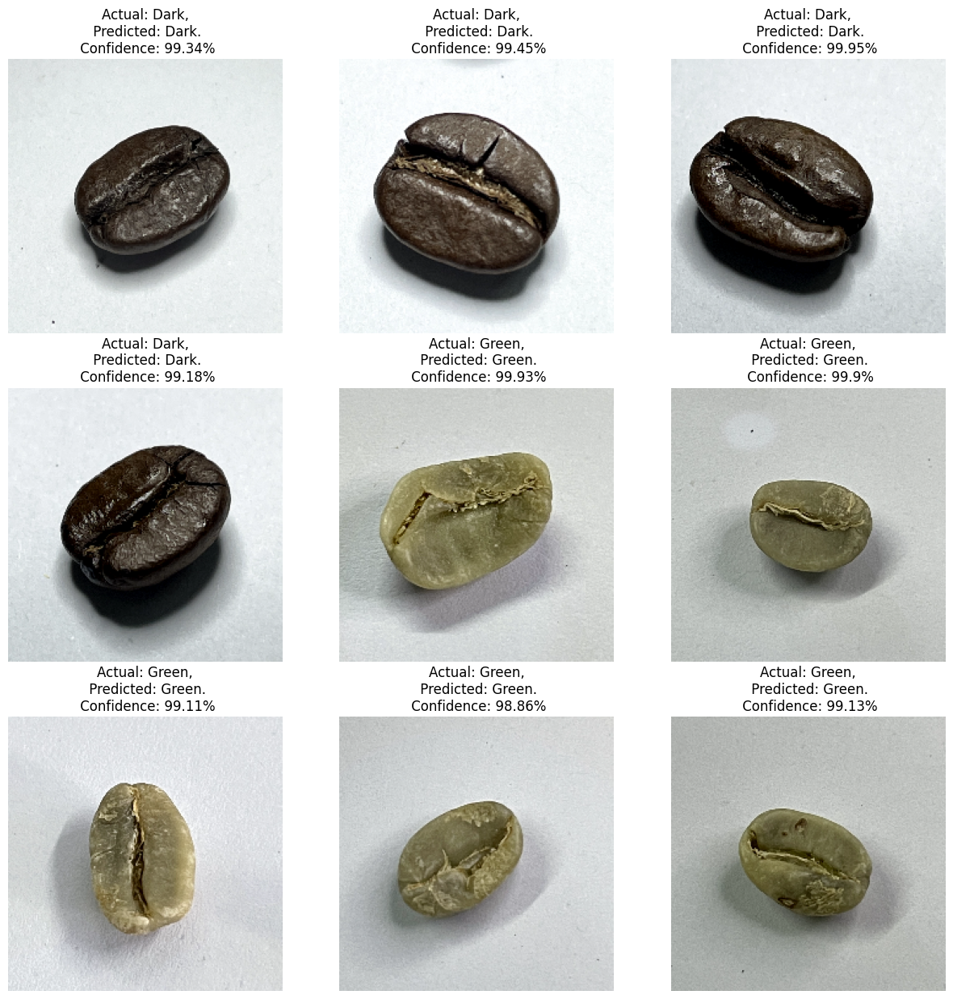

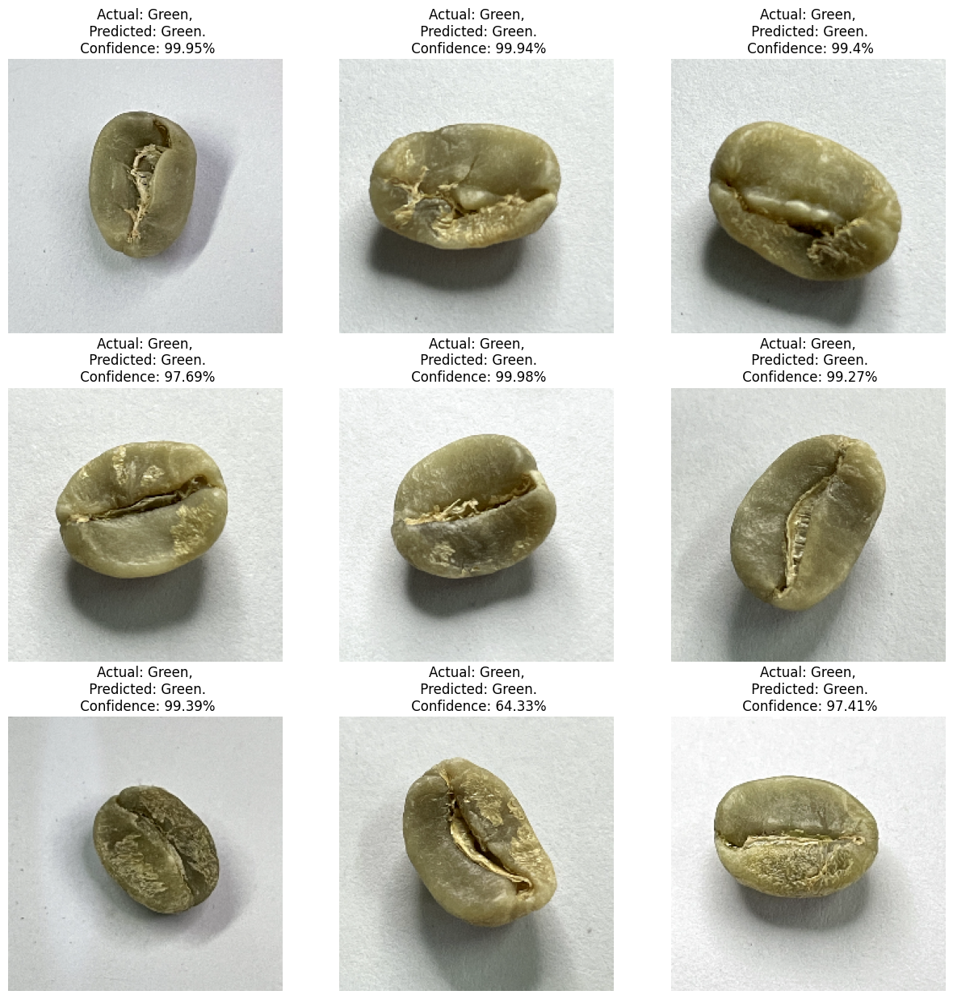

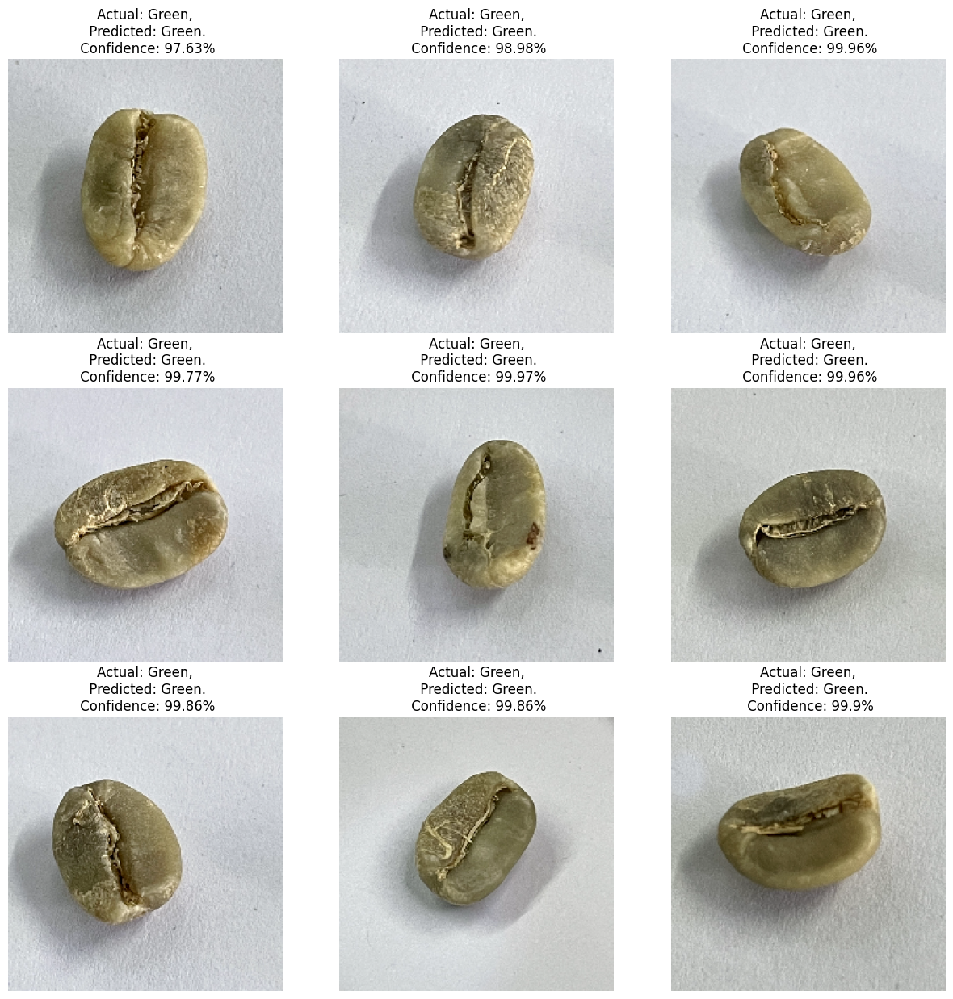

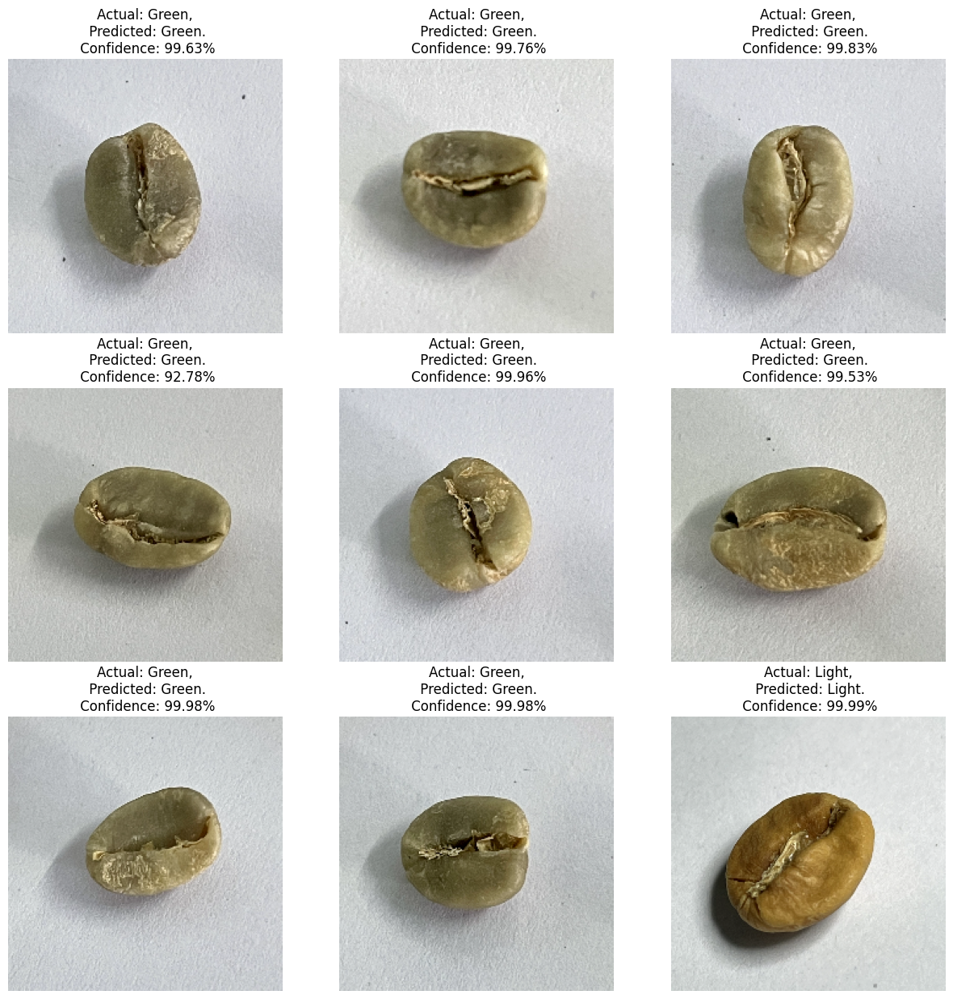

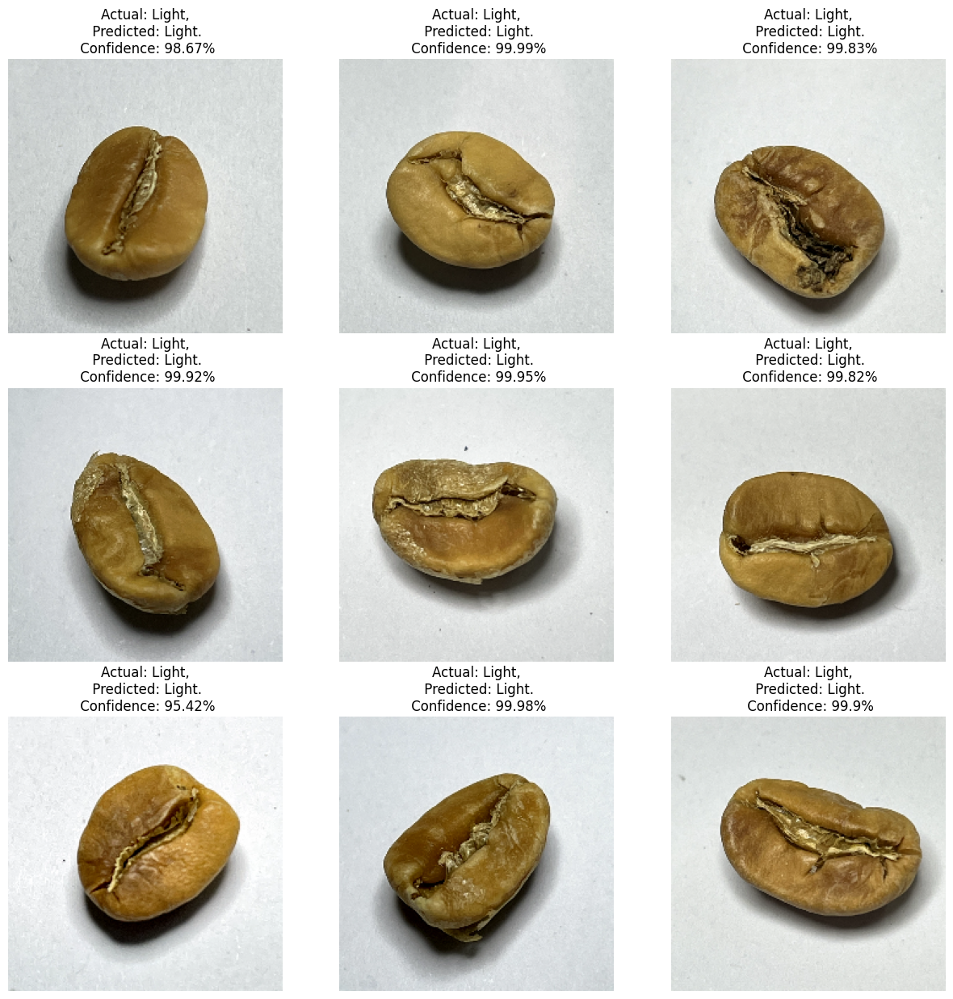

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image_dataset_from_directory


def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    predictions = transfer_model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

test_ds_path = '/content/extracted/data_image_png_3024x3024/coffee_dataset/test'
test_ds = image_dataset_from_directory(
    test_ds_path,
    shuffle=False,
    batch_size=32,
    image_size=(img_height, img_width)
)

class_names = test_ds.class_names

for images, labels in test_ds.take(8):
    plt.figure(figsize=(15, 15))
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(transfer_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

plt.show()


In [ ]:


!pip install keras-tuner


### Hayperparameter Tuning

In [ ]:
from tensorflow.keras.layers import CenterCrop
from tensorflow.keras.layers import Rescaling
from kerastuner.tuners import RandomSearch
from kerastuner.tuners import Hyperband

def create_model(hp):
    model = tf.keras.models.Sequential([
        data_augmentation,
        keras.Input(shape=(None, None, 3)),
        CenterCrop(height=img_height, width=img_width),
        tf.keras.layers.Conv2D(hp.Int('conv1_units', min_value=16, max_value=64, step=16), (3, 3), strides=2, activation="relu"),
        tf.keras.layers.Conv2D(hp.Int('conv2_units', min_value=16, max_value=64, step=16), (3, 3), strides=2, activation="relu"),
        tf.keras.layers.Conv2D(hp.Int('conv3_units', min_value=16, max_value=64, step=16), (3, 3), strides=2, activation="relu"),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(hp.Int('dense1_units', min_value=64, max_value=512, step=64), activation="relu"),
        tf.keras.layers.Dropout(hp.Float('dropout1', min_value=0.2, max_value=0.5, step=0.1)),
        tf.keras.layers.Dense(hp.Int('dense2_units', min_value=64, max_value=512, step=64), activation="relu"),
        tf.keras.layers.Dropout(hp.Float('dropout2', min_value=0.2, max_value=0.5, step=0.1)),
        tf.keras.layers.Dense(num_classes, activation="softmax")
    ])


    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model
# hyperprameter tuner (Hyperband)
tuner = Hyperband(
    create_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='tuner_directory',
    project_name='my_hyperparameter_tuning',
    overwrite=True)

tuner.search(train_ds,
             epochs=10,
             validation_data=val_ds)

best_model = tuner.get_best_models(num_models=1)[0]
best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values

print("Best Hyperparameters:", best_hyperparameters)

Trial 30 Complete [00h 08m 54s]
val_accuracy: 0.96875

Best val_accuracy So Far: 0.9708333611488342
Total elapsed time: 01h 45m 59s
Best Hyperparameters: {'conv1_units': 48, 'conv2_units': 16, 'conv3_units': 32, 'dense1_units': 384, 'dropout1': 0.2, 'dense2_units': 384, 'dropout2': 0.4, 'tuner/epochs': 10, 'tuner/initial_epoch': 4, 'tuner/bracket': 1, 'tuner/round': 1, 'tuner/trial_id': '0019'}


## Test The Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

model_path = "/content/drive/MyDrive/Colab Notebooks/Rust_TRanfer_learning_model.h5"
transfer_model = load_model(model_path)

test_data_dir = '/content/extracted/data_image_png_3024x3024/coffee_dataset/test'

test_datagen = ImageDataGenerator()

batch_size = 16

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(299, 299),
    batch_size=batch_size,
    class_mode='categorical'
)

evaluation = transfer_model.evaluate(test_generator)

print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])


Found 400 images belonging to 4 classes.
25/25 [==============================] - 105s 4s/step - loss: 0.1862 - accuracy: 0.9525
Test Loss: 0.18624264001846313
Test Accuracy: 0.9524999856948853


#Refrence To Dataset

- https://www.kaggle.com/datasets/sot2542/coffee-bean-dataset-v1